# Detect faces on Steam banners

References:
-   code to download images from Steam: `download_steam_banners.ipynb` in [`woctezuma/google-colab`][code]
-   code to filter out images (duplicates, etc.):
    - for PNG logos: `remove_duplicates.ipynb` in [`woctezuma/google-colab`][code]
    - for JPG banners: `remove_duplicates.ipynb` in [`woctezuma/steam-stylegan2-ada`][code-ada]
-   image data stored on Google Drive: [`woctezuma/download-steam-banners-data`][images]

[code]: <https://github.com/woctezuma/google-colab>
[code-ada]: <https://github.com/woctezuma/steam-stylegan2-ada>
[images]: <https://github.com/woctezuma/download-steam-banners-data>

 ## Install

In [ ]:
%pip install Google-Colab-Transfer face-alignment dlib

## Set global parameters

In [ ]:
def get_image_root_name():
  image_root_name = 'library_600x900'

  return image_root_name 

In [ ]:
def get_image_extension():
  image_extension = '.jpg'

  return image_extension

## Import data

In [ ]:
import colab_transfer

gd = colab_transfer.get_path_to_home_of_google_drive()
lm = colab_transfer.get_path_to_home_of_local_machine()

colab_transfer.mount_google_drive()

Mounted at /content/drive/


### Import filtered banners

In [ ]:
archive_name = 'filtered_vertical_steam_banners.tar'

In [ ]:
colab_transfer.copy_file(file_name=archive_name,
                         source = gd + 'data/')

Copying /content/drive/My Drive/data/filtered_vertical_steam_banners.tar to /content/filtered_vertical_steam_banners.tar


In [ ]:
%cd /content/

!echo tar -xf {archive_name}
!tar -xf {archive_name}

/content
tar -xf filtered_vertical_steam_banners.tar


### Import resized banners

In [ ]:
archive_name = 'resized_vertical_steam_banners.tar'
# archive_name = 'resized_vertical_steam_banners_14k.tar'

In [ ]:
colab_transfer.copy_file(file_name=archive_name,
                         source = gd + 'data/')

Copying /content/drive/My Drive/data/resized_vertical_steam_banners.tar to /content/resized_vertical_steam_banners.tar


In [ ]:
%cd /content/

!echo tar -xf {archive_name}
!tar -xf {archive_name}

/content
tar -xf resized_vertical_steam_banners.tar


## Boilerplate functions

### Parsing utils

In [ ]:
from pathlib import Path

def get_app_id(file_name, image_extension=None):
  if image_extension is None:
    image_extension = get_image_extension()

  app_id = Path(file_name).name.replace(image_extension, '')

  return app_id

In [ ]:
def get_url(file_name=None,
            app_id=None):
  if app_id is None:
    app_id = get_app_id(file_name)

  url = 'https://cdn.cloudflare.steamstatic.com/steam/apps/{}/{}{}'.format(app_id,
                                                                           get_image_root_name(),
                                                                           get_image_extension())

  return url

### Disk utils

In [ ]:
import glob
import os

def list_file_names(image_dir,
                    file_ext=None):
  if file_ext is None:
    file_ext = get_image_extension()

  if not image_dir.endswith('/'):
    image_dir += '/'

  file_names = glob.glob(image_dir + '*' + file_ext)

  return file_names

In [ ]:
def save_app_ids_to_file(output_file_name, 
                         image_dir):
  file_names = list_file_names(image_dir)

  app_ids = [
            str(get_app_id(f)) for f in file_names
  ]

  app_ids = sorted(app_ids, key=int)

  print('#appIDs = {}'.format(len(app_ids)))

  with open(output_file_name, 'w') as f:
    f.write('\n'.join(app_ids))

  return

### Face detection utils (`face-alignment`)

In [306]:
# Reference: detect_from_image() in class SFDDetector.
# https://github.com/1adrianb/face-alignment/blob/2b9463127b69bc405e33ca7b77897244f3c5a53e/face_alignment/detection/sfd/sfd_detector.py#L31-L39

import face_alignment
from skimage import io

def detect_face_bbox_fast(image_or_path, fa=None, verbose=False):
  if fa is None:
    fa = face_alignment.FaceAlignment(face_alignment.LandmarksType._2D)

  if isinstance(image_or_path, str):
    image = io.imread(image_or_path)
  else:
    image = image_or_path
  
  try:
    # Caveat: you need to go from RGB to BGR for the following function call:
    bboxlist = fa.face_detector.detect_from_image(image[..., ::-1].copy())
  except (ValueError, IndexError):
    bboxlist = []

  if verbose:
    print('#bboxes = {}'.format(len(bboxlist)))

  return bboxlist

### Face display utils (`face-alignment`)

Reference: https://github.com/1adrianb/face-alignment/tree/master/examples

In [ ]:
import collections

plot_style = dict(marker='o',
                  markersize=4,
                  linestyle='-',
                  lw=2)

pred_type = collections.namedtuple('prediction_type', ['slice', 'color'])
pred_types = {'face': pred_type(slice(0, 17), (0.682, 0.780, 0.909, 0.5)),
              'eyebrow1': pred_type(slice(17, 22), (1.0, 0.498, 0.055, 0.4)),
              'eyebrow2': pred_type(slice(22, 27), (1.0, 0.498, 0.055, 0.4)),
              'nose': pred_type(slice(27, 31), (0.345, 0.239, 0.443, 0.4)),
              'nostril': pred_type(slice(31, 36), (0.345, 0.239, 0.443, 0.4)),
              'eye1': pred_type(slice(36, 42), (0.596, 0.875, 0.541, 0.3)),
              'eye2': pred_type(slice(42, 48), (0.596, 0.875, 0.541, 0.3)),
              'lips': pred_type(slice(48, 60), (0.596, 0.875, 0.541, 0.3)),
              'teeth': pred_type(slice(60, 68), (0.596, 0.875, 0.541, 0.4))
              }

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def display_landmarks_raw(input_img,
                          preds=None,
                          fig_size=None):
  # This is a raw copy from:
  # https://github.com/1adrianb/face-alignment/blob/master/examples/detect_landmarks_in_image.py

  if fig_size is None:
    fig_size = plt.figaspect(.5)

  fig = plt.figure(figsize=fig_size)
  ax = fig.add_subplot(1, 1, 1) # only display one image
  ax.imshow(input_img)

  if preds is not None:

    p_list = []
    try:
      for p in preds: # <--- important edit to work with face_alignment and dlib
        p_list.append(p)
      print('#faces = {}'.format(len(preds)))
    except IndexError:
      p_list.append(preds)

    for p in p_list:

      # Bounding box
      # Reference: https://stackoverflow.com/a/37437395/376454
      xm = min(p[:,0])
      xM = max(p[:,0])
      ym = min(p[:,1])
      yM = max(p[:,1])
      # Create a Rectangle patch
      # Reference: https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.patches.Rectangle.html
      rect = patches.Rectangle((xm,ym),xM-xm,yM-ym,
                                linewidth=3,
                                edgecolor='r',
                                facecolor='none')
      # Add the patch to the Axes
      ax.add_patch(rect)

      # Landmarks
      for pred_type in pred_types.values():
          ax.plot(p[pred_type.slice, 0],
                  p[pred_type.slice, 1],
                  color=pred_type.color, **plot_style)          

  ax.axis('off')

  return

### Face detection utils (`dlib`)

Reference: https://colab.research.google.com/github/woctezuma/stylegan2-projecting-images/blob/master/stylegan2_projecting_images.ipynb

#### Predictor of face landmarks (dlib)

This is the trained shape predictor model from dlib.

In [ ]:
model_file = 'shape_predictor_68_face_landmarks.dat.bz2'

In [ ]:
!wget http://dlib.net/files/$model_file

--2020-11-25 10:38:28--  http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Resolving dlib.net (dlib.net)... 107.180.26.78
Connecting to dlib.net (dlib.net)|107.180.26.78|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64040097 (61M)
Saving to: ‘shape_predictor_68_face_landmarks.dat.bz2’

shape_predictor_68_ 100%[===================>]  61.07M  18.2MB/s    in 5.2s    

2020-11-25 10:38:33 (11.9 MB/s) - ‘shape_predictor_68_face_landmarks.dat.bz2’ saved [64040097/64040097]



In [ ]:
# Reference: https://superuser.com/a/480951
!bzip2 -dk shape_predictor_68_face_landmarks.dat.bz2

#### Boilerplate function to detect face landmarks

In [ ]:
import dlib

def detect_face_bbox(img_name=None,
                     img=None,
                     detector=None,
                     verbose=True):
  # References:
  # -   http://dlib.net/face_landmark_detection.py.html
  # -   http://dlib.net/face_alignment.py.html

  # Load the model: a detector to find the faces
  if detector is None:
    detector = dlib.get_frontal_face_detector()

  if img is None:
    img = dlib.load_rgb_image(img_name)

  # Ask the detector to find the bounding boxes of each face. The 1 in the
  # second argument indicates that we should upsample the image 1 time. This
  # will make everything bigger and allow us to detect more faces.
  dets = detector(img, 1)
    
  num_faces = len(dets)
  if verbose:
    print("Number of faces detected: {}".format(num_faces))

  return dets

In [ ]:
import dlib

def detect_face_landmarks(img_name=None,
                          img=None,
                          dets=None,
                          detector=None,
                          shape_predictor=None):
    
  # References:
  # -   http://dlib.net/face_landmark_detection.py.html
  # -   http://dlib.net/face_alignment.py.html

  # Load the model: a shape predictor to find face landmarks,
  # so we can precisely localize the face
  if shape_predictor is None:
    predictor_path = 'shape_predictor_68_face_landmarks.dat'
    shape_predictor = dlib.shape_predictor(predictor_path)

  # Load the model: a detector to find the faces
  if detector is None:
    detector = dlib.get_frontal_face_detector()

  if img is None:
    img = dlib.load_rgb_image(img_name)

  if dets is None:
    dets = detect_face_bbox(img_name=img_name,
                            img=img,
                            detector=detector)

  # Find the face landmarks we need to do the alignment.
  faces = dlib.full_object_detections()
  for d in dets:
      print("Left: {} Top: {} Right: {} Bottom: {}".format(
          d.left(), d.top(), d.right(), d.bottom()
      ))

      shape = shape_predictor(img, d)
      faces.append(shape)

  return faces

### Face display utils (`dlib`)

In [ ]:
import numpy as np
from skimage import io

def display_landmarks(image_name=None, 
                      dlib_output_faces=None, 
                      fig_size=None,
                      img=None):

  if img is None:
    print("Processing file: {}".format(image_name))
    img = io.imread(image_name)

  if fig_size is None:
    fig_size = plt.figaspect(.5)
    # fig_size = [15, 15]

  if dlib_output_faces is None:
    dlib_output_faces = detect_face_landmarks(img_name=image_name,
                                              img=img)

  preds = []

  for current_face in dlib_output_faces:
    face_parts = current_face.parts()

    current_preds = np.array([
                      [v.x, v.y] 
                      for v in face_parts
                      ])

    preds.append(current_preds)

  display_landmarks_raw(input_img=img, 
                        preds=preds,
                        fig_size=fig_size)

  return

## Check face detection

### Load an image

In [ ]:
!wget -O temp.jpg https://cdn.cloudflare.steamstatic.com/steam/apps/1235140/header.jpg

--2020-11-25 11:09:30--  https://cdn.cloudflare.steamstatic.com/steam/apps/1235140/header.jpg
Resolving cdn.cloudflare.steamstatic.com (cdn.cloudflare.steamstatic.com)... 104.18.25.217, 104.18.24.217, 2606:4700::6812:19d9, ...
Connecting to cdn.cloudflare.steamstatic.com (cdn.cloudflare.steamstatic.com)|104.18.25.217|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64250 (63K) [image/jpeg]
Saving to: ‘temp.jpg’

temp.jpg            100%[===================>]  62.74K  --.-KB/s    in 0.004s  

2020-11-25 11:09:31 (16.0 MB/s) - ‘temp.jpg’ saved [64250/64250]



In [ ]:
from skimage import io

face_file_path = 'temp.jpg'
input_img = io.imread(face_file_path)

### Detect with `face_alignment`

In [ ]:
import face_alignment

fa = face_alignment.FaceAlignment(face_alignment.LandmarksType._2D)

bboxlist = detect_face_bbox_fast(input_img, fa=fa)

In [ ]:
import face_alignment

fa = face_alignment.FaceAlignment(face_alignment.LandmarksType._2D)

preds = fa.get_landmarks_from_image(input_img)

#faces = 6


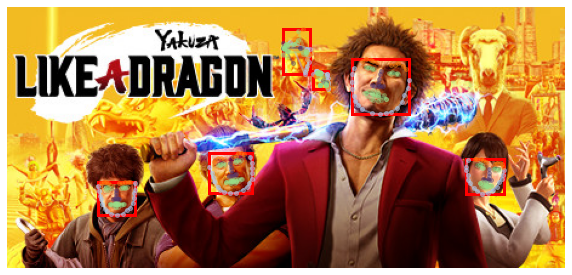

In [ ]:
display_landmarks_raw(input_img, 
                      preds,
                      fig_size=[10,10])

### Detect with `dlib`

In [ ]:
import dlib

detector = dlib.get_frontal_face_detector()

dets = detect_face_bbox(img=input_img,
                        detector=detector)

Number of faces detected: 4


In [ ]:
import dlib

shape_predictor = dlib.shape_predictor('shape_predictor_68_face_landmarks.dat')

faces = detect_face_landmarks(img=input_img,
                              dets=dets,
                              shape_predictor=shape_predictor)

Left: 69 Top: 138 Right: 105 Bottom: 174
Left: 279 Top: 38 Right: 331 Bottom: 90
Left: 165 Top: 118 Right: 201 Bottom: 154
Left: 377 Top: 122 Right: 413 Bottom: 158


#faces = 4


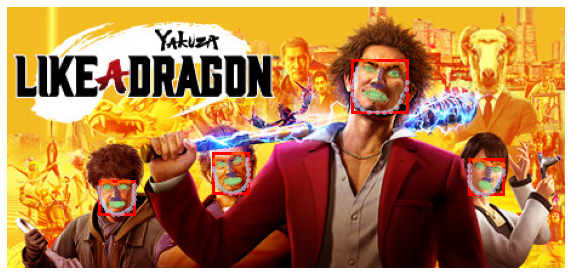

In [ ]:
display_landmarks(img=input_img,
                  dlib_output_faces=faces,
                  fig_size=[10,10])

## Run the detection process on all the images

### Data

In [ ]:
image_dir = 'original_vertical_steam_banners'
# image_dir = 'resized_vertical_steam_banners'

image_dir = 'data/' + image_dir

In [ ]:
file_names = list_file_names(image_dir=image_dir)
print('{} images in {}'.format(len(file_names), image_dir))

14176 images in data/original_vertical_steam_banners


### Use `dlib` (reliable, but slow)

Speed:
-   for original images: 10 images/second.
-   for resized images: 20 images/second.

#### Functions

##### Detection (bbox or landmarks)

In [ ]:
import dlib
from skimage import io

def process_image_batch_with_dlib(file_names,
                                  refine_with_landmarks=False,
                                  load_with_skimage = True):
  detector = dlib.get_frontal_face_detector()

  if refine_with_landmarks:
    predictor_path = 'shape_predictor_68_face_landmarks.dat'
    shape_predictor = dlib.shape_predictor(predictor_path)  
  else:
    shape_predictor = None

  app_id_dict = dict()
  for i, img_name in enumerate(file_names, start=1):
    if i % 100 == 0:
      print('After {}/{}, faces detected on {} images.'.format(i,
                                                              len(file_names),
                                                              len(app_id_dict)))

    app_id = get_app_id(img_name)

    if load_with_skimage:
      input_img = io.imread(img_name)
    else:
      input_img = dlib.load_rgb_image(img_name)    

    dets = detector(input_img, 1)
    
    num_faces = len(dets)

    if refine_with_landmarks and (num_faces > 0):
      # Caveat: with dlib, you will always get the same number of faces
      # before and after refinement, which defeats our purpose of trimming
      # detection results. The code below is only there in case of curiosity.
      faces = dlib.full_object_detections()
      for d in dets:
        shape = shape_predictor(input_img, d)
        faces.append(shape)
      num_faces = len(faces)     

    if num_faces > 0:
      app_id_dict[str(app_id)] = num_faces

  return app_id_dict

##### Save/Load

In [ ]:
def figure_filename_with_dlib(image_dir,
                              refine_with_landmarks=False):

  if 'resized' in image_dir:
    out_fname = 'app_ids_with_faces_with_dlib_resized.json'
  else:
    out_fname = 'app_ids_with_faces_with_dlib.json'

  if refine_with_landmarks:
    out_fname = 'refined_' + out_fname

  return out_fname

In [ ]:
import json

def save_app_id_dict_with_dlib(app_id_dict,
                               image_dir,
                               refine_with_landmarks=False):

  out_fname = figure_filename_with_dlib(image_dir,
                                        refine_with_landmarks)

  print('Saving {}'.format(out_fname))

  with open(out_fname, 'w') as f:
    json.dump(app_id_dict, f)

  return

In [ ]:
import json

def load_app_id_dict_with_dlib(image_dir,
                               refine_with_landmarks=False):

  out_fname = figure_filename_with_dlib(image_dir,
                                        refine_with_landmarks)

  print('Loading {}'.format(out_fname))

  with open(out_fname, 'r') as f:
    app_id_dict = json.load(f)

  return app_id_dict

#### Run

In [ ]:
# image_dir = 'data/original_vertical_steam_banners'
# image_dir = 'data/resized_vertical_steam_banners'

print('Directory: {}'.format(image_dir))
file_names = list_file_names(image_dir=image_dir)
app_id_dict = process_image_batch_with_dlib(file_names)
save_app_id_dict_with_dlib(app_id_dict, image_dir)

In [ ]:
# image_dir = 'data/original_vertical_steam_banners'
# image_dir = 'data/resized_vertical_steam_banners'

app_id_dict = load_app_id_dict_with_dlib(image_dir,
                                         refine_with_landmarks=False)

print('Directory: {}'.format(image_dir))
file_names = [fname 
              for fname in list_file_names(image_dir=image_dir)
              if get_app_id(fname) in app_id_dict
]
print('Refining {} detection results'.format(len(file_names)))
app_id_dict = process_image_batch_with_dlib(file_names,
                                            refine_with_landmarks=True)
print('Total: {} refined detection results.'.format(len(app_id_dict)))
save_app_id_dict_with_dlib(app_id_dict,
                           image_dir,
                           refine_with_landmarks=True)

### Use `face_alignment` (less reliable, but 3.5 times faster)

Speed:
-   for original images: 37 images/second.
-   for resized images: 70 images/second.

#### Functions

##### Detection (bbox or landmarks)

In [ ]:
import face_alignment
from skimage import io

def process_image_batch_with_fa(file_names,
                                refine_with_landmarks=False):
  fa = face_alignment.FaceAlignment(face_alignment.LandmarksType._2D)

  app_id_dict = dict()
  for i, img_name in enumerate(file_names, start=1):
    if i % 100 == 0:
      print('After {}/{}, faces detected on {} images.'.format(i,
                                                              len(file_names),
                                                              len(app_id_dict)))

    app_id = get_app_id(img_name)

    input_img = io.imread(img_name)

    try:
      bboxlist = detect_face_bbox_fast(input_img, fa=fa)
    except ValueError:
      bboxlist = []

    num_faces = len(bboxlist)

    if refine_with_landmarks and (num_faces > 0):
      # Caveat: do not specify 'detected_faces=bboxlist' in the call to
      # fa.get_landmarks_from_image(). Otherwise, you will always get as many
      # faces from 'landmarks' as you had gotten from 'bboxes', which defeats
      # the purpose of refinement for our objective to trim detection results!
      #
      # preds = fa.get_landmarks_from_image(input_img, detected_faces=bboxlist)
      #
      try:
        preds = fa.get_landmarks_from_image(input_img)
      except IndexError:
        preds = None
        
      if preds is not None:
        num_faces = len(preds)
      else:
        num_faces = 0

    if num_faces > 0:
      app_id_dict[str(app_id)] = num_faces

  return app_id_dict

##### Save/Load

In [ ]:
def figure_filename_with_fa(image_dir,
                            refine_with_landmarks=False):

  if 'resized' in image_dir:
    out_fname = 'app_ids_with_faces_with_fa_resized.json'
  else:
    out_fname = 'app_ids_with_faces_with_fa.json'

  if refine_with_landmarks:
    out_fname = 'refined_' + out_fname
    
  return out_fname

In [ ]:
import json

def save_app_id_dict_with_fa(app_id_dict,
                             image_dir,
                             refine_with_landmarks=False):

  out_fname = figure_filename_with_fa(image_dir,
                                      refine_with_landmarks)

  print('Saving {}'.format(out_fname))

  with open(out_fname, 'w') as f:
    json.dump(app_id_dict, f)

  return

In [ ]:
import json

def load_app_id_dict_with_fa(image_dir,
                             refine_with_landmarks=False):

  out_fname = figure_filename_with_fa(image_dir,
                                      refine_with_landmarks)

  print('Loading {}'.format(out_fname))

  with open(out_fname, 'r') as f:
    app_id_dict = json.load(f)

  return app_id_dict

#### Run

In [ ]:
# image_dir = 'data/original_vertical_steam_banners'
# image_dir = 'data/resized_vertical_steam_banners'

print('Directory: {}'.format(image_dir))
file_names = list_file_names(image_dir=image_dir)
app_id_dict = process_image_batch_with_fa(file_names)
save_app_id_dict_with_fa(app_id_dict, image_dir)

In [ ]:
# image_dir = 'data/original_vertical_steam_banners'
image_dir = 'data/resized_vertical_steam_banners'

app_id_dict = load_app_id_dict_with_fa(image_dir,
                                       refine_with_landmarks=False)

print('Directory: {}'.format(image_dir))
file_names = [fname 
              for fname in list_file_names(image_dir=image_dir)
              if get_app_id(fname) in app_id_dict
]
print('Refining {} detection results'.format(len(file_names)))
app_id_dict = process_image_batch_with_fa(file_names,
                                          refine_with_landmarks=True)
print('Total: {} refined detection results.'.format(len(app_id_dict)))
save_app_id_dict_with_fa(app_id_dict, 
                         image_dir,
                         refine_with_landmarks=True)

### Analyze detection results

In [ ]:
image_dir = 'data/original_vertical_steam_banners'
# image_dir = 'data/resized_vertical_steam_banners'

use_dlib = False
refine_with_landmarks = True

if use_dlib:
  app_id_dict = load_app_id_dict_with_dlib(image_dir,
                                           refine_with_landmarks=refine_with_landmarks)  
else:
  app_id_dict = load_app_id_dict_with_fa(image_dir,
                                         refine_with_landmarks=refine_with_landmarks)

Loading refined_app_ids_with_faces_with_fa.json


In [ ]:
data_for_faces = [i for i in app_id_dict.values()]

In [ ]:
from scipy import stats

summary = stats.describe(data_for_faces)
print(summary)

DescribeResult(nobs=3242, minmax=(1, 20), mean=1.8439235040098705, variance=2.033639399268434, skewness=2.9726794213959087, kurtosis=15.839441208899643)


In [ ]:
import collections

counter = collections.Counter(data_for_faces)

print('[#faces: #images] sorted by insertion order:\n{}'.format(
    counter,
))

print('\n[#faces: #images] sorted by key:\n{}'.format(
    {k:counter[k] for k in sorted(counter, key=int)},
    ))

most_common_band = counter.most_common()[0][0]

print('\nMost common case:\n#faces={}'.format(most_common_band))

[#faces: #images] sorted by insertion order:
Counter({1: 1905, 2: 670, 3: 333, 4: 153, 5: 83, 6: 53, 7: 16, 8: 12, 9: 8, 10: 3, 11: 3, 13: 2, 20: 1})

[#faces: #images] sorted by key:
{1: 1905, 2: 670, 3: 333, 4: 153, 5: 83, 6: 53, 7: 16, 8: 12, 9: 8, 10: 3, 11: 3, 13: 2, 20: 1}

Most common case:
#faces=1


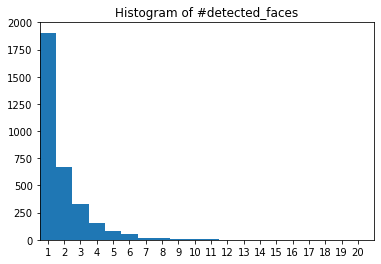

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

bin_start = min(data_for_faces) - 0.5
num_bins = max(data_for_faces) + 1

_ = plt.hist(data_for_faces, bins=np.arange(num_bins)-0.5)
plt.xticks(range(num_bins))
plt.xlim([bin_start, num_bins])
plt.title("Histogram of #detected_faces")
plt.show()

### Display

#### Function

In [ ]:
import face_alignment

from skimage import io

def display_top_results(app_id_dict,
                        image_dir,
                        app_id_pool = None,
                        use_dlib = False,
                        max_displayed_images = 10,
                        fig_size = None):
  if fig_size is None:
    fig_size = [10, 10]

  if app_id_pool is None:
    app_id_pool = sorted(app_id_dict,
                         key=lambda i: app_id_dict[i],
                         reverse=True)

  if not use_dlib:
    fa = face_alignment.FaceAlignment(face_alignment.LandmarksType._2D)

  for app_id in app_id_pool[:max_displayed_images]:
    print('\nAppID = {}'.format(app_id))
    fname = '/content/{}/{}.jpg'.format(image_dir, app_id)
    
    input_img = io.imread(fname)

    if use_dlib:
      faces = detect_face_landmarks(img=input_img)

      display_landmarks(img=input_img,
                        dlib_output_faces=faces,
                        fig_size = fig_size)
    else:
      bboxlist = detect_face_bbox_fast(input_img, fa, verbose=True)

      preds = fa.get_landmarks_from_image(input_img)

      display_landmarks_raw(input_img=input_img,
                            preds=preds,
                            fig_size = fig_size)

  return

#### Run

##### `dlib`

Loading refined_app_ids_with_faces_with_dlib.json

AppID = 893560
Number of faces detected: 13
Left: 253 Top: 362 Right: 289 Bottom: 398
Left: 9 Top: 242 Right: 45 Bottom: 278
Left: 253 Top: 302 Right: 289 Bottom: 338
Left: 253 Top: 242 Right: 289 Bottom: 278
Left: 69 Top: 182 Right: 105 Bottom: 218
Left: 129 Top: 242 Right: 165 Bottom: 278
Left: 69 Top: 362 Right: 105 Bottom: 398
Left: 7 Top: 175 Right: 50 Bottom: 218
Left: 129 Top: 182 Right: 165 Bottom: 218
Left: 193 Top: 182 Right: 229 Bottom: 218
Left: 193 Top: 302 Right: 229 Bottom: 338
Left: 133 Top: 362 Right: 169 Bottom: 398
Left: 69 Top: 302 Right: 105 Bottom: 338
#faces = 13

AppID = 1222670
Number of faces detected: 7
Left: 16 Top: 257 Right: 59 Bottom: 300
Left: 223 Top: 46 Right: 266 Bottom: 89
Left: 69 Top: 242 Right: 112 Bottom: 286
Left: 222 Top: 251 Right: 273 Bottom: 303
Left: 175 Top: 7 Right: 218 Bottom: 50
Left: 12 Top: 36 Right: 55 Bottom: 79
Left: 55 Top: 31 Right: 98 Bottom: 74
#faces = 7

AppID = 642090
Number

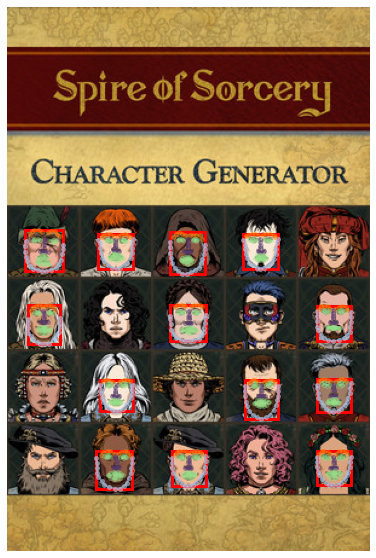

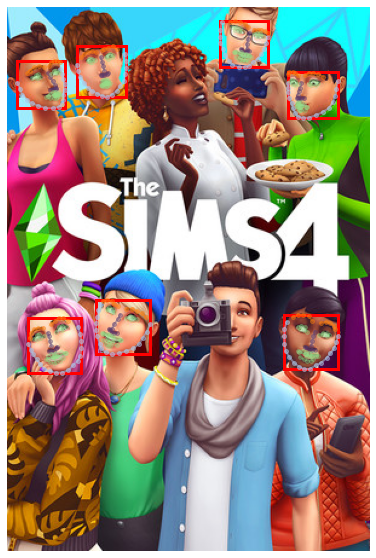

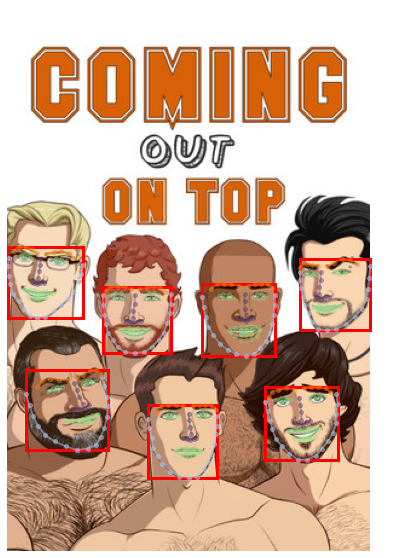

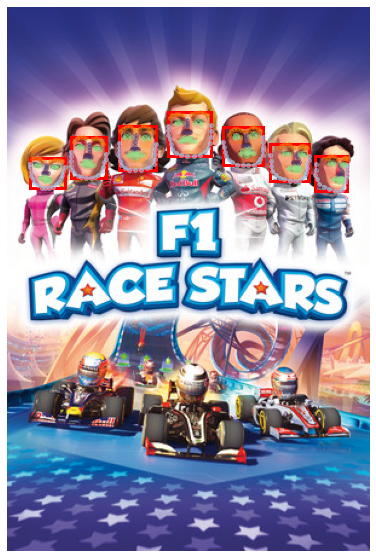

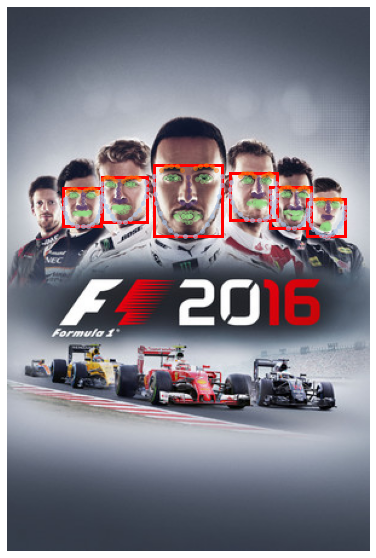

...

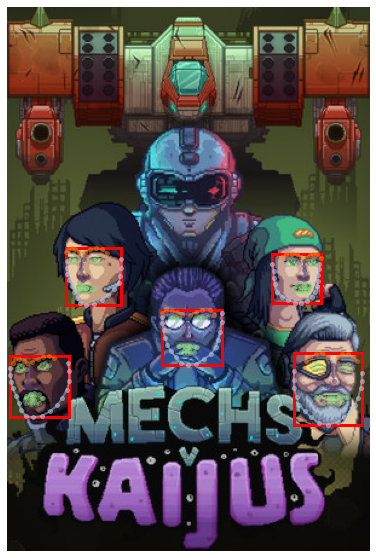

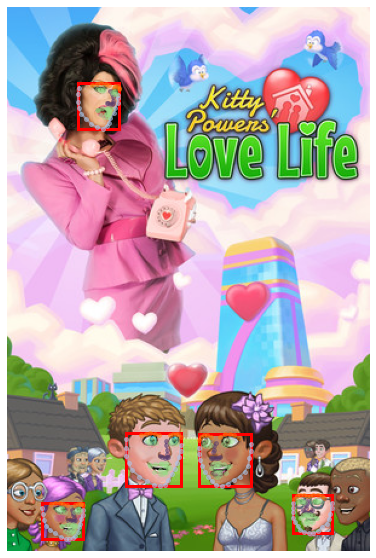

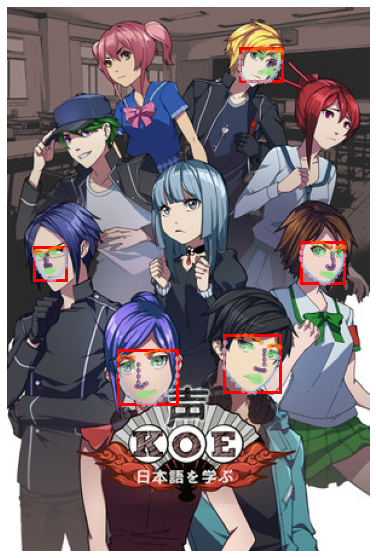

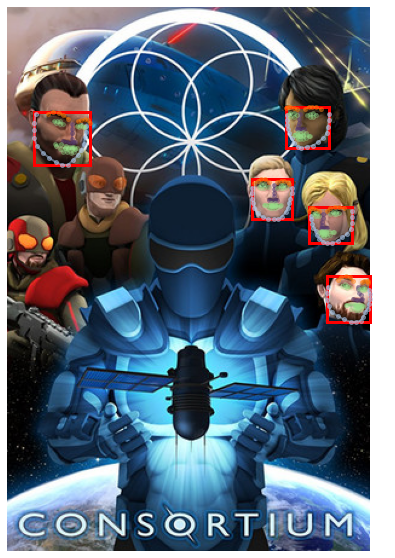

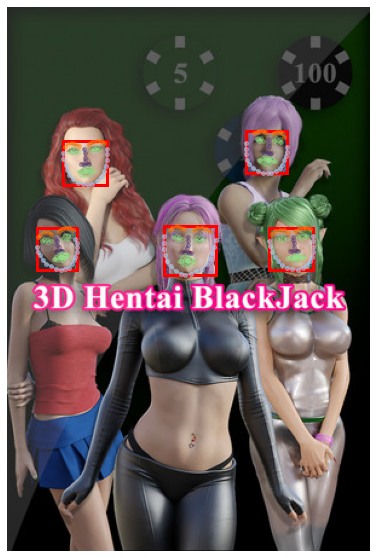

In [308]:
use_dlib = True
max_displayed_images = 20
fig_size = [10, 10]

if use_dlib:
  app_id_dict = load_app_id_dict_with_dlib(image_dir,
                                           refine_with_landmarks=True)
else:
  app_id_dict = load_app_id_dict_with_fa(image_dir,
                                         refine_with_landmarks=refine_with_landmarks)

app_id_pool = sorted(app_id_dict,
                      key=lambda i: app_id_dict[i],
                      reverse=True)

display_top_results(app_id_dict,
                    image_dir,
                    app_id_pool=app_id_pool,
                    use_dlib=use_dlib,
                    max_displayed_images=max_displayed_images,
                    fig_size=fig_size)

##### `face_alignment`

Loading refined_app_ids_with_faces_with_fa.json

AppID = 893560
#bboxes = 20
#faces = 20

AppID = 869350
#bboxes = 4
#faces = 13

AppID = 285740
#bboxes = 6
#faces = 13

AppID = 416870
#bboxes = 9
#faces = 11

AppID = 554180
#bboxes = 6
#faces = 11

AppID = 817840
#bboxes = 4
#faces = 11

AppID = 656780
#bboxes = 10
#faces = 10

AppID = 832500
#bboxes = 6
#faces = 10

AppID = 949670
#bboxes = 10
#faces = 10

AppID = 1222670
#bboxes = 10
#faces = 9

AppID = 1150580
#bboxes = 8
#faces = 9

AppID = 921590
#bboxes = 1
#faces = 9

AppID = 1372990
#bboxes = 1
#faces = 9

AppID = 1360980
#bboxes = 8
#faces = 9

AppID = 758370
#bboxes = 8
#faces = 9

AppID = 478020
#bboxes = 3
#faces = 9

AppID = 994730
#bboxes = 2
#faces = 9

AppID = 1089630
#bboxes = 3
#faces = 8

AppID = 4850
#bboxes = 1
#faces = 8

AppID = 1323710
#bboxes = 4
#faces = 8


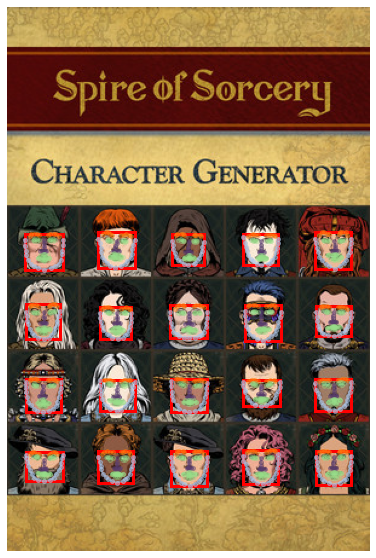

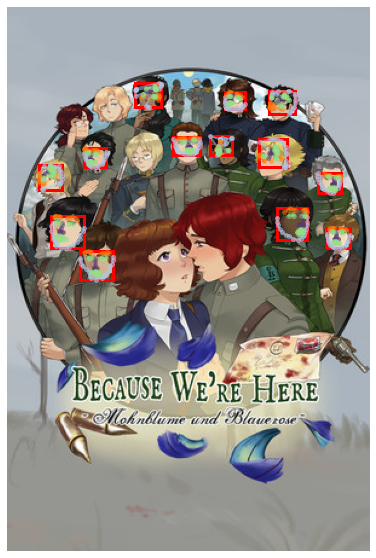

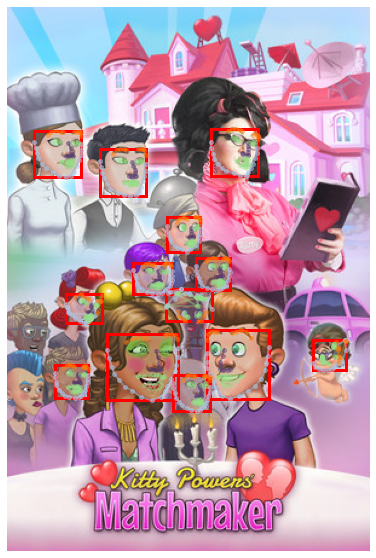

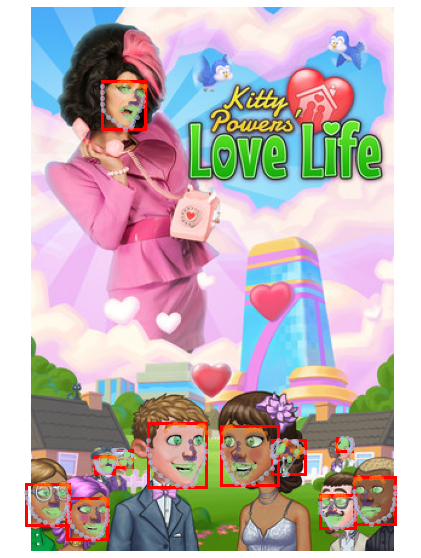

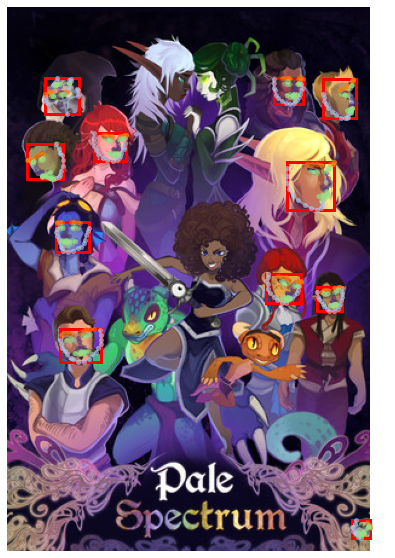

...

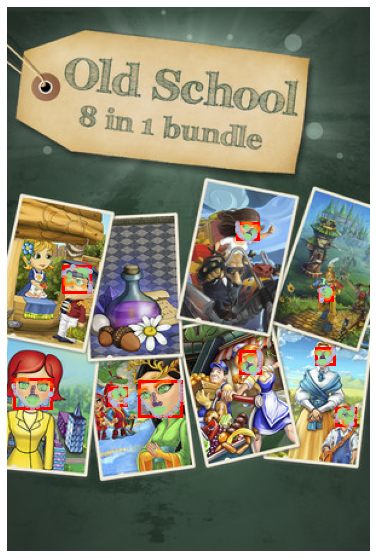

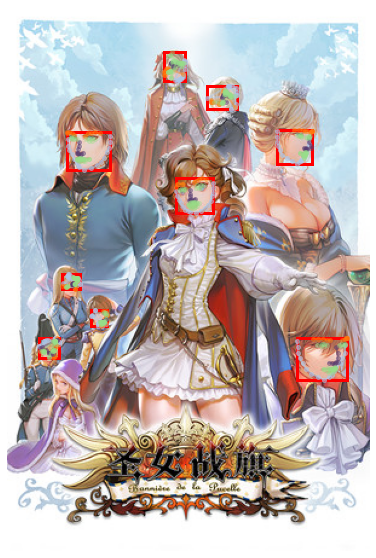

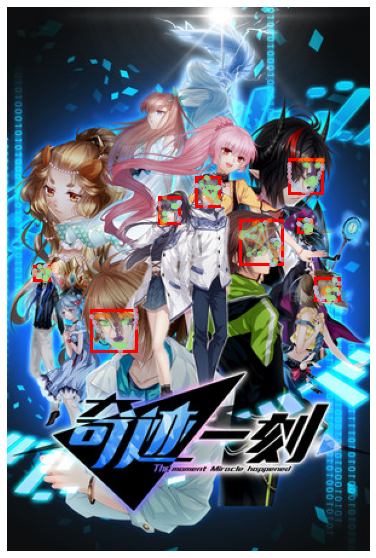

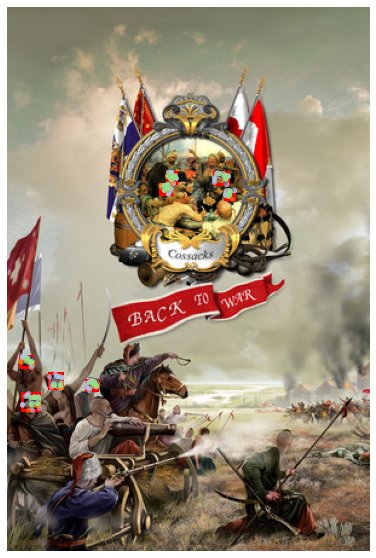

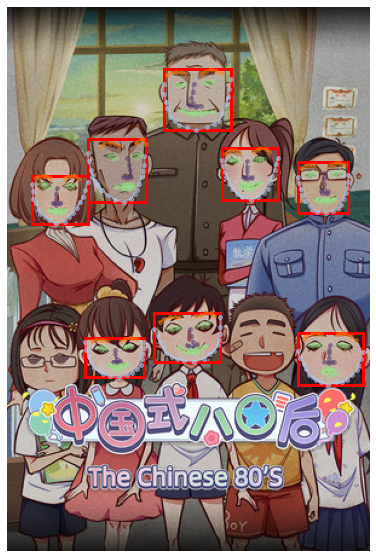

In [309]:
use_dlib = False
max_displayed_images = 20
fig_size = [10, 10]

if use_dlib:
  app_id_dict = load_app_id_dict_with_dlib(image_dir,
                                           refine_with_landmarks=True)
else:
  app_id_dict = load_app_id_dict_with_fa(image_dir,
                                         refine_with_landmarks=refine_with_landmarks)

app_id_pool = sorted(app_id_dict,
                      key=lambda i: app_id_dict[i],
                      reverse=True)

display_top_results(app_id_dict,
                    image_dir,
                    app_id_pool=app_id_pool,
                    use_dlib=use_dlib,
                    max_displayed_images=max_displayed_images,
                    fig_size=fig_size)

Done.